<a href="https://colab.research.google.com/github/IanVlasov/NVidia_DL_in_CV/blob/lesson_5/Vlasov_Ian_HW05.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Обучал на своих фотографиях, их было немного, размечал вручную. Результат не достаточно точный, но что-то получилось. Неточности из-за недостаточного количества примеров.
Используемые туториалы:
* https://habr.com/ru/post/358146/
* https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/training.html#exporting-a-trained-inference-graph
* https://medium.com/analytics-vidhya/training-an-object-detection-model-with-tensorflow-api-using-google-colab-4f9a688d5e8b

## Установка TF Object Detection API

In [1]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
%cd '/content/gdrive/My Drive/DL_in_CV/Lesson_5'

/content/gdrive/My Drive/DL_in_CV/Lesson_5


In [4]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 36656, done.
remote: Total 36656 (delta 0), reused 0 (delta 0), pack-reused 36656
Receiving objects: 100% (36656/36656), 520.33 MiB | 19.08 MiB/s, done.
Resolving deltas: 100% (24429/24429), done.
Checking out files: 100% (2566/2566), done.


In [0]:
!apt-get install protobuf-compiler python-pil python-lxml python-tk
!pip install Cython

In [6]:
%cd /content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research/
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research
object_detection/protos/input_reader.proto: warning: Import object_detection/protos/image_resizer.proto but not used.


In [0]:
import os
os.environ['PYTHONPATH'] += ':/content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research/:/content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research/slim'

In [0]:
!python setup.py build
!python setup.py install

In [9]:
!pip install tf_slim

In [9]:
%cd /content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research/object_detection/builders/
!python model_builder_test.py

/content/gdrive/My Drive/DL_in_CV/Lesson_5/models/research/object_detection/builders


## Подготовка датасета

In [10]:
%cd /content/gdrive/My Drive/DL_in_CV/Lesson_5/

/content/gdrive/My Drive/DL_in_CV/Lesson_5


In [0]:
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET

In [17]:
# конвертация xml в csv
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

def main(directory_list):
    for Image_cat in directory_list:
        image_path = os.path.join(os.getcwd(), 'images/{}'.format(Image_cat))
        xml_df = xml_to_csv(image_path) 
        xml_df.to_csv('annotations/{}_labels.csv'.format(Image_cat), index=None)
        print('Successfully converted xml to csv.')

main(['train','test'])

Successfully converted xml to csv.
Successfully converted xml to csv.


In [39]:
!python generate_tfrecord.py --label0=pizza --label1=limonade --csv_input=annotations/train_labels.csv --output_path=annotations/train.record --img_path=images/train
!python generate_tfrecord.py --label0=pizza --label1=limonade --csv_input=annotations/test_labels.csv --output_path=annotations/test.record --img_path=images/test

Successfully created the TFRecords: /content/gdrive/My Drive/DL_in_CV/Lesson_5/annotations/train.record
Successfully created the TFRecords: /content/gdrive/My Drive/DL_in_CV/Lesson_5/annotations/test.record


In [0]:
from models.research.object_detection.protos.string_int_label_map_pb2 import StringIntLabelMap, StringIntLabelMapItem
from google.protobuf import text_format


def convert_classes(classes, start=1):
    msg = StringIntLabelMap()
    for id, name in enumerate(classes, start=start):
        msg.item.append(StringIntLabelMapItem(id=id, name=name))

    text = str(text_format.MessageToBytes(msg, as_utf8=True), 'utf-8')
    return text

In [44]:
%cd /content/gdrive/My Drive/DL_in_CV/Lesson_5/annotations

txt = convert_classes(['pizza', 'limonade'])
print(txt)
with open('label_map.pbtxt', 'w') as f:
    f.write(txt)

/content/gdrive/My Drive/DL_in_CV/Lesson_5/annotations
item {
  name: "pizza"
  id: 1
}
item {
  name: "limonade"
  id: 2
}



## Скачивание и подготвка модели

In [0]:
!wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v1_coco_11_06_2017.tar.gz
!tar -xvf ssd_mobilenet_v1_coco_11_06_2017.tar.gz

In [0]:
%load_ext tensorboard
%tensorboard --logdir training/

## Обучение

In [0]:
%cd /content/gdrive/My Drive/DL_in_CV/Lesson_5/
!python model_main.py --alsologtostderr --model_dir=training/ --pipeline_config_path=training/ssd_inception_v2_coco.config

## Сохранение

In [0]:
!python export_inference_graph.py --input_type image_tensor --pipeline_config_path training/ssd_inception_v2_coco.config --trained_checkpoint_prefix training/model.ckpt-200 --output_directory trained-inference-graph/output_inference_graph_v1.pb


## Предсказания

In [0]:
import tensorflow as tf
import numpy as np

In [0]:
SAVED_MODEL_PATH = '/content/gdrive/My Drive/DL_in_CV/Lesson_5/trained-inference-graph/output_inference_graph_v1.pb/frozen_inference_graph.pb'

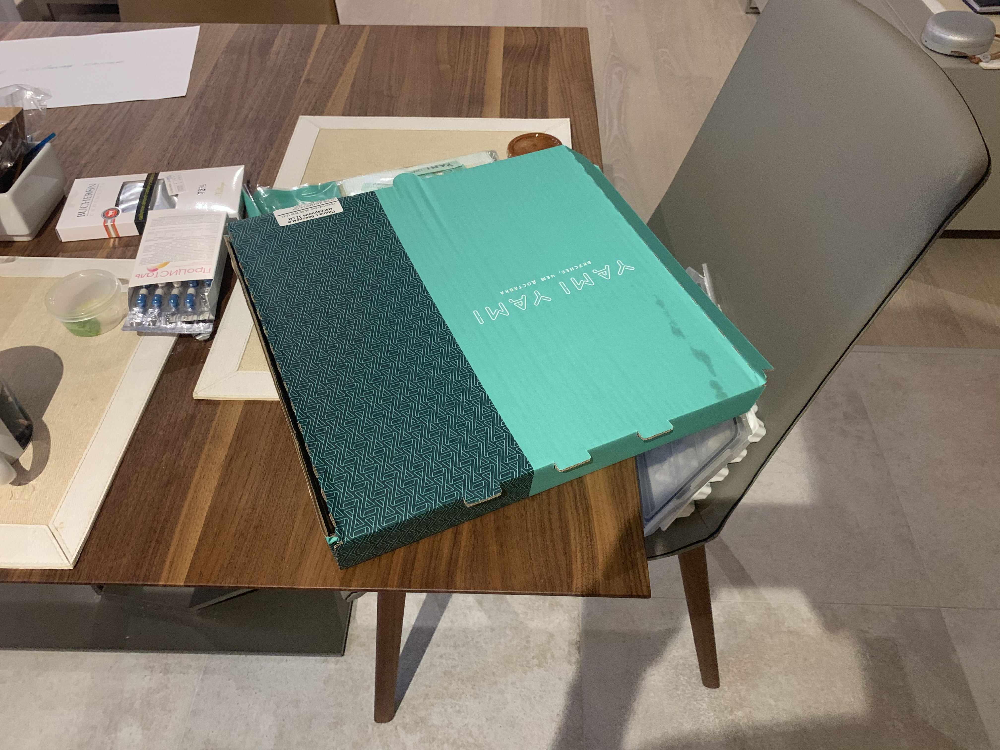

In [65]:
from IPython.display import Image
import os

file_path = '/content/gdrive/My Drive/DL_in_CV/Lesson_5/images/test/IMG_2123.jpg'

Image(file_path, width=400, height=400)

In [0]:
from object_detector import ObjectDetector

In [66]:
oject_detector = ObjectDetector('/content/gdrive/My Drive/DL_in_CV/Lesson_5/trained-inference-graph/output_inference_graph_v1.pb/frozen_inference_graph.pb',
                                '/content/gdrive/My Drive/DL_in_CV/Lesson_5/annotations/label_map.pbtxt')

oject_detector.object_detection(image_dir='/content/gdrive/My Drive/DL_in_CV/Lesson_5/images', filename=file_path)
[[i['category_box'],i['img_name'],i['category_id'], i['category_proba']] for i in oject_detector.img_detections[:5]]
#oject_detector.img_detections
np.unique([i['category_name'] for i in oject_detector.img_detections])

array(['limonade', 'pizza'], dtype='<U8')

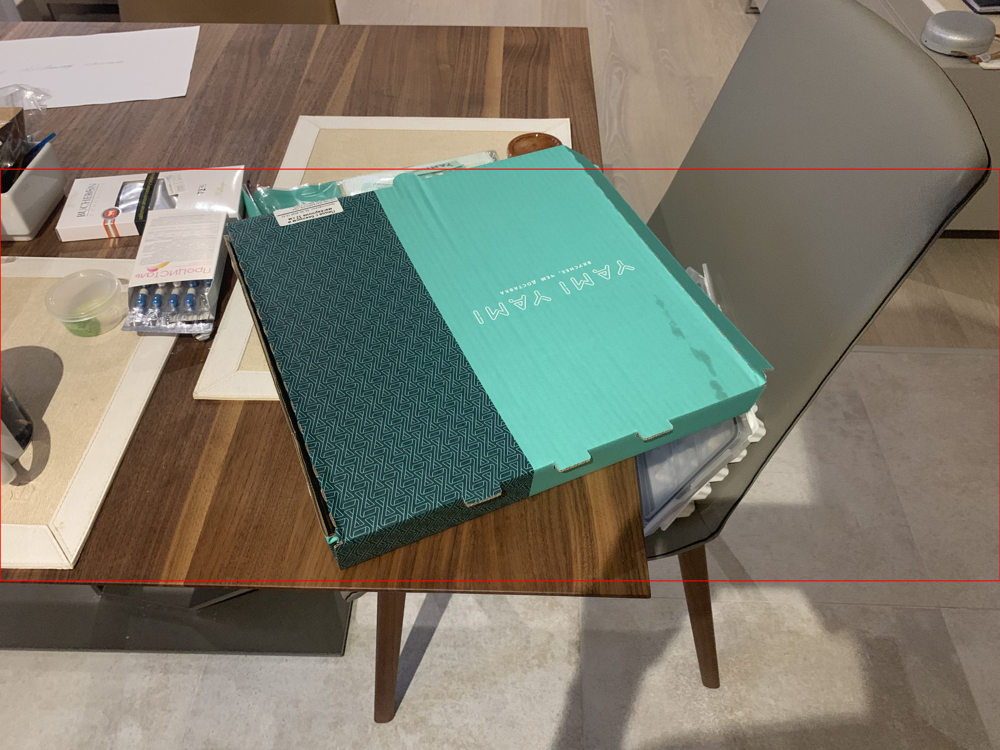

In [68]:
import sys
import os

import matplotlib.pyplot as plt
plt.switch_backend('agg')

sys.path.append(os.path.join('/content', 'models/research'))
from object_detection.utils import visualization_utils as vis_util

from PIL import Image as Pil_image

%matplotlib inline
boxes = np.array([oject_detector.img_detections[3]['category_box']])

def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)
# загружаем картинку и превращаем в массив
image = Pil_image.open(file_path)
image_np = load_image_into_numpy_array(image)
# накладываем на массив bounding boxes
vis_util.draw_bounding_boxes_on_image_array(image_np, boxes)
# сохраняем картинку на диск
result_file_path = os.path.join('/content', 'test.png')
vis_util.save_image_array_as_png(image_np, result_file_path)
# виуализируем картинку, которую сохранили
from IPython.display import Image
Image(result_file_path, width=400, height=400)